In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 27.7 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
print("Ultralytics YOLOv9 is installed and ready!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics YOLOv9 is installed and ready!


In [3]:
!kaggle datasets download -d inspiring-lab/nepali-vehicles-number-plate-dataset

Dataset URL: https://www.kaggle.com/datasets/inspiring-lab/nepali-vehicles-number-plate-dataset
License(s): Attribution-NonCommercial 4.0 International (CC BY-NC 4.0)
 83% 17.0M/20.6M [00:00<00:00, 49.9MB/s]
100% 20.6M/20.6M [00:00<00:00, 51.9MB/s]


In [4]:
!unzip nepali-vehicles-number-plate-dataset.zip -d nepali-vehicles-number-plate-dataset

Streaming output truncated to the last 5000 lines.
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_05_55.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_06_49.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_14_40.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_27_32.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_32_55.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_35_53.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_37_06.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/images/2021-03-23_07_42_19.jpg  
  inflating: nepali-vehicles-number-plate-dataset/open_source_nepali_plates/i

In [5]:
import os
import shutil
import random

random.seed(42)

# Define paths
dataset_dir = '/content/nepali-vehicles-number-plate-dataset/open_source_nepali_plates'
images_dir = os.path.join(dataset_dir, 'images')
annotations_dir = os.path.join(dataset_dir, 'labels')
output_dir = 'yolov9_data'

# Create necessary directories
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(output_dir, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels', split), exist_ok=True)

# Get list of image files
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"Total images: {len(image_files)}")

# Shuffle the dataset
random.shuffle(image_files)

# Split ratios
train_split = 0.8
val_split = 0.1
test_split = 0.1

train_size = int(len(image_files) * train_split)
val_size = int(len(image_files) * val_split)

train_files = image_files[:train_size]
val_files = image_files[train_size:train_size + val_size]
test_files = image_files[train_size + val_size:]

print(f"Training set: {len(train_files)} images")
print(f"Validation set: {len(val_files)} images")
print(f"Testing set: {len(test_files)} images")

# Function to copy files
def copy_files(file_list, split):
    for file in file_list:
        # Copy images
        shutil.copy(os.path.join(images_dir, file), os.path.join(output_dir, 'images', split, file))

        # Copy corresponding annotations
        annotation_file = os.path.splitext(file)[0] + '.txt'
        annotation_src = os.path.join(annotations_dir, annotation_file)
        annotation_dst = os.path.join(output_dir, 'labels', split, os.path.splitext(file)[0] + '.txt')
        if os.path.exists(annotation_src):
            shutil.copy(annotation_src, annotation_dst)
        else:
            print(f"Annotation file {annotation_src} does not exist.")

# Copy files to respective directories
copy_files(train_files, 'train')
copy_files(val_files, 'val')
copy_files(test_files, 'test')

print("Dataset split and files copied successfully.")

Total images: 2503
Training set: 2002 images
Validation set: 250 images
Testing set: 251 images
Dataset split and files copied successfully.


In [6]:
import os

# Define the dataset directory
dataset_dir = 'nepali-vehicles-number-plate-dataset'

# List the contents of the dataset directory
for root, dirs, files in os.walk(dataset_dir):
    level = root.replace(dataset_dir, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print(f'{indent}{os.path.basename(root)}/')
    subindent = ' ' * 4 * (level + 1)
    for f in files:
        print(f'{subindent}{f}')

Streaming output truncated to the last 5000 lines.
            22021-03-18_15_47_45.txt
            22021-03-19_10_26_06.txt
            2021-03-26_10_09_53.txt
            2021-03-26_11_19_19.txt
            image_2145.txt
            22021-03-17_12_46_43.txt
            2021-03-27_14_52_02.txt
            22021-03-19_15_41_15.txt
            2021-03-25_16_45_33.txt
            22021-03-31_14_57_04.txt
            embossed_image_33.txt
            22021-03-20_14_24_26.txt
            2021-03-26_17_25_48.txt
            state_image_1227.txt
            22021-03-19_12_39_53.txt
            2021-03-26_09_39_31.txt
            2021-03-24_11_37_52.txt
            2021-03-27_15_03_50.txt
            32021-03-16_12_53_53.txt
            state_image_84.txt
            2021-03-24_13_46_02.txt
            2021-03-26_21_42_12.txt
            22021-03-20_14_39_37.txt
            2021-03-27_10_09_37.txt
            22021-03-19_08_02_23.txt
            state_image_1156.txt
            image_417.txt

In [1]:
import os

def validate_annotations(labels_dir, classes):
    """
    Validates that all annotations are in the correct YOLOv9 format.

    Parameters:
    - labels_dir (str): Path to the labels directory.
    - classes (list): List of class names.

    Returns:
    - None
    """
    invalid_files = []
    for label_file in os.listdir(labels_dir):
        if not label_file.endswith('.txt'):
            continue
        label_path = os.path.join(labels_dir, label_file)
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    invalid_files.append(label_file)
                    break
                class_id, x_center, y_center, width, height = parts
                # Check if class_id is an integer and within range
                if not class_id.isdigit() or int(class_id) >= len(classes):
                    invalid_files.append(label_file)
                    break
                # Check if coordinates are floats between 0 and 1
                try:
                    x_center = float(x_center)
                    y_center = float(y_center)
                    width = float(width)
                    height = float(height)
                    if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and
                            0 <= width <= 1 and 0 <= height <= 1):
                        invalid_files.append(label_file)
                        break
                except ValueError:
                    invalid_files.append(label_file)
                    break
    if invalid_files:
        print(f"Found {len(invalid_files)} files with invalid annotations:")
        for file in invalid_files:
            print(f"- {file}")
    else:
        print("All annotation files are valid and in YOLOv9 format.")

# Define classes
classes = ['number_plate']

# Paths to labels directories
labels_dirs = {
    'train': os.path.join('yolov9_data', 'labels', 'train'),
    'val': os.path.join('yolov9_data', 'labels', 'val'),
    'test': os.path.join('yolov9_data', 'labels', 'test')
}

# Validate annotations for each split
for split, labels_dir in labels_dirs.items():
    print(f"Validating {split} annotations...")
    validate_annotations(labels_dir, classes)
    print("\n")

Validating train annotations...
All annotation files are valid and in YOLOv9 format.


Validating val annotations...
All annotation files are valid and in YOLOv9 format.


Validating test annotations...
All annotation files are valid and in YOLOv9 format.




In [2]:
import cv2
import matplotlib.pyplot as plt
import random
import os

Visualizing train samples...


ValueError: Image size of 427718x37387 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>

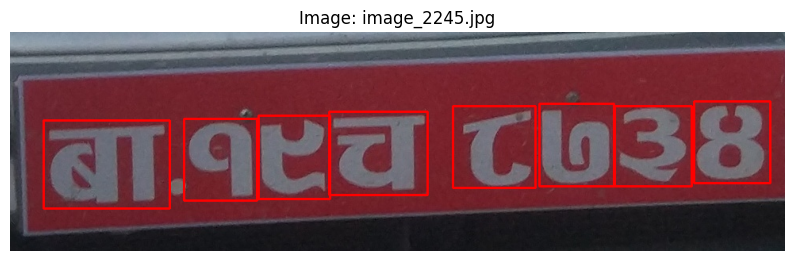

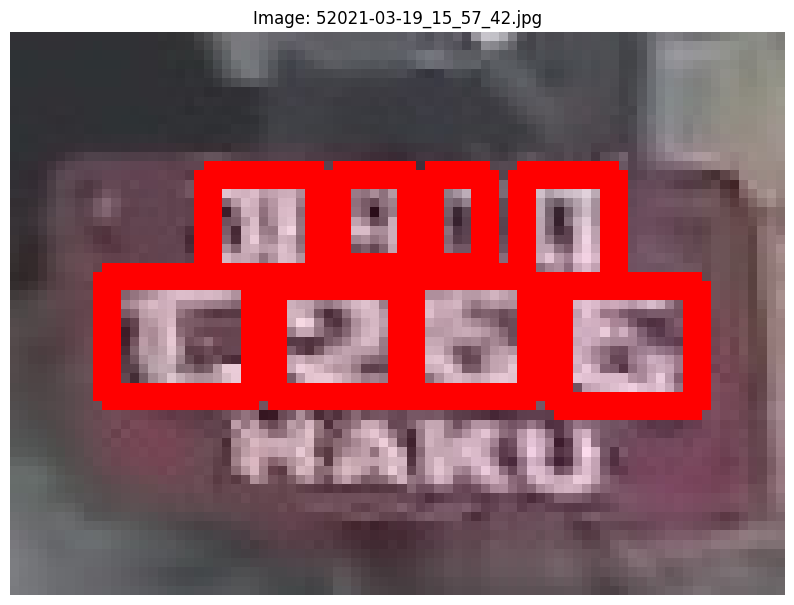

ValueError: Image size of 80518x20755 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>

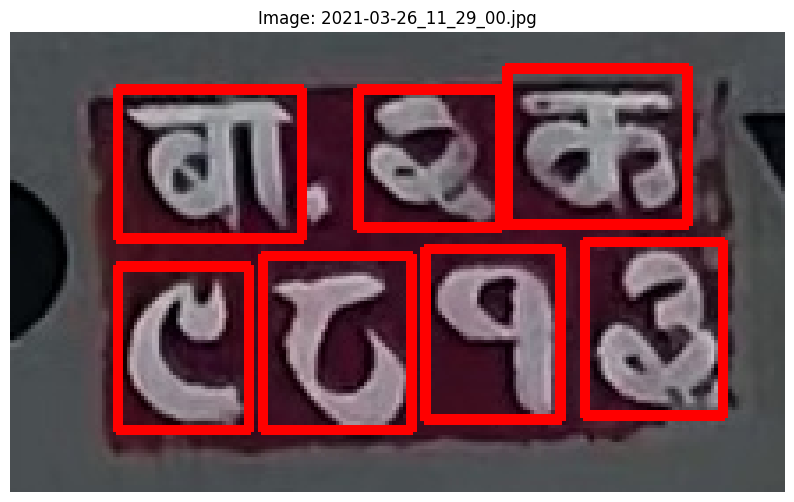

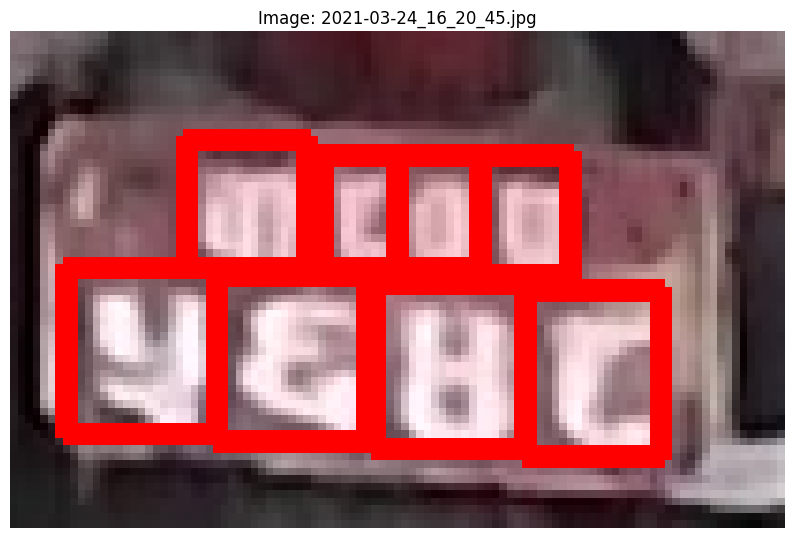

ValueError: Image size of 68118x19276 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>

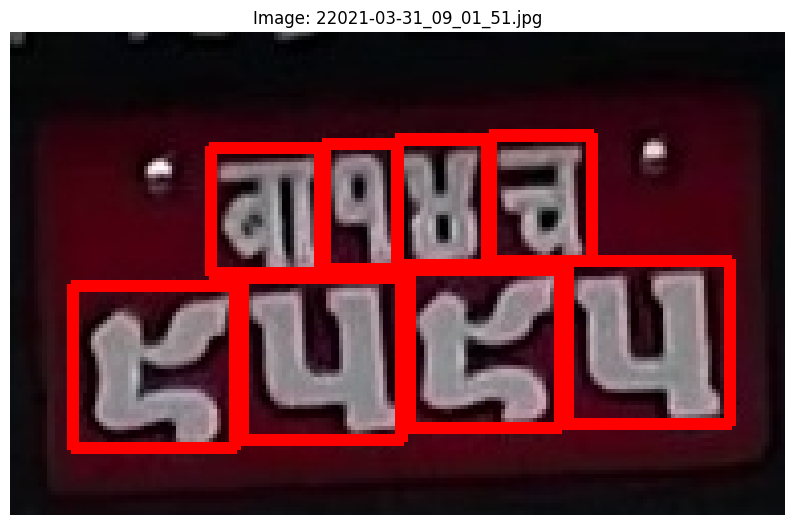



Visualizing val samples...


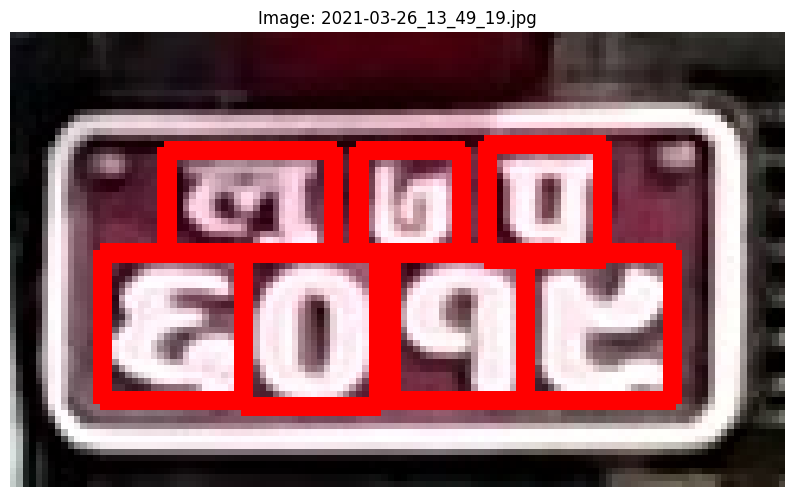

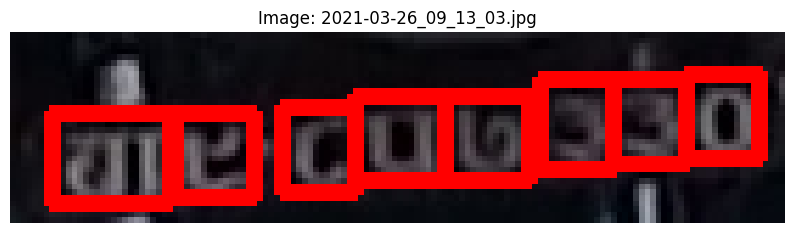

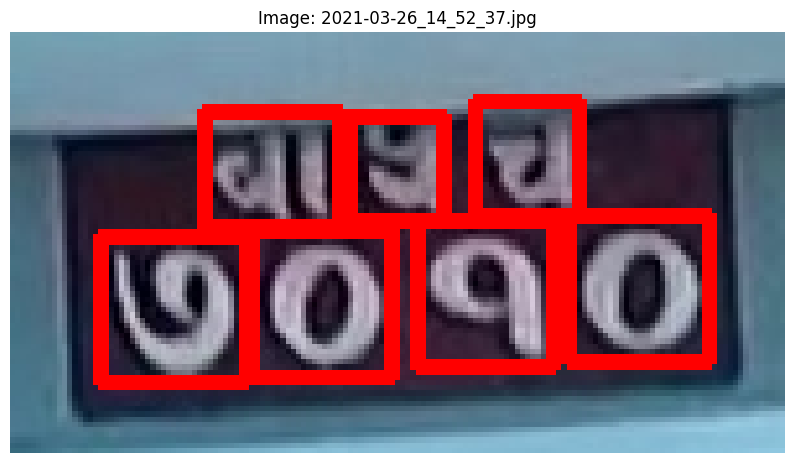

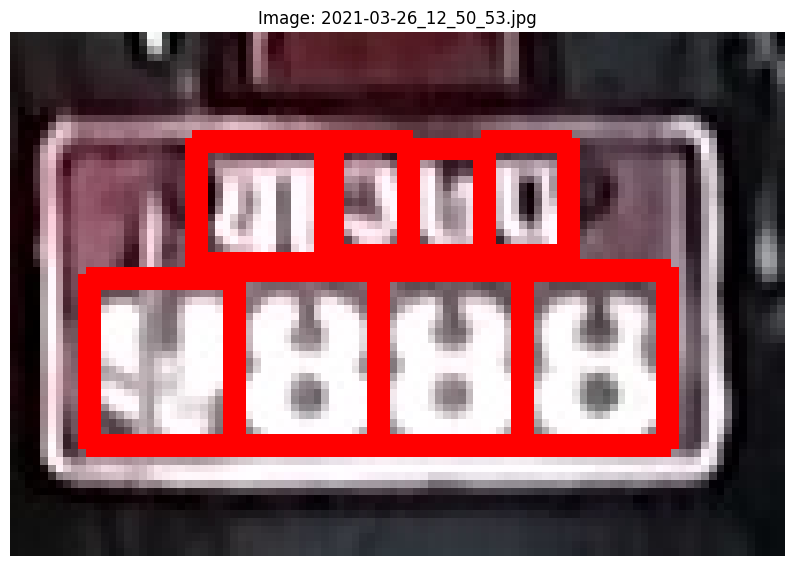

In [ ]:
def visualize_annotations(images_dir, labels_dir, classes, num_samples=5):
    """
    Displays sample images with their bounding boxes.

    Parameters:
    - images_dir (str): Path to the images directory.
    - labels_dir (str): Path to the labels directory.
    - classes (list): List of class names.
    - num_samples (int): Number of samples to visualize.

    Returns:
    - None
    """
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if len(image_files) == 0:
        print(f"No images found in {images_dir}.")
        return
    sampled_files = random.sample(image_files, min(num_samples, len(image_files)))

    for img_file in sampled_files:
        img_path = os.path.join(images_dir, img_file)
        label_file = os.path.splitext(img_file)[0] + '.txt'
        label_path = os.path.join(labels_dir, label_file)

        # Read image
        image = cv2.imread(img_path)
        if image is None:
            print(f"Failed to read image: {img_path}")
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, _ = image.shape

        # Read labels
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, parts)

                # Convert to absolute coordinates
                x_center_abs = x_center * width
                y_center_abs = y_center * height
                bbox_width_abs = bbox_width * width
                bbox_height_abs = bbox_height * height

                # Calculate top-left and bottom-right coordinates
                x_min = int(x_center_abs - bbox_width_abs / 2)
                y_min = int(y_center_abs - bbox_height_abs / 2)
                x_max = int(x_center_abs + bbox_width_abs / 2)
                y_max = int(y_center_abs + bbox_height_abs / 2)

                # Draw rectangle
                cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

                # Put class label
                label = classes[int(class_id)]
                plt.text(x_min, y_min - 10, label, color='red', fontsize=12, backgroundcolor='white')

        # Display image
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image: {img_file}")
        plt.show()

# Visualize samples from each split
for split in ['train', 'val', 'test']:
    print(f"Visualizing {split} samples...")
    images_dir = os.path.join('yolov9_data', 'images', split)
    labels_dir = os.path.join('yolov9_data', 'labels', split)
    visualize_annotations(images_dir, labels_dir, classes, num_samples=5)
    print("\n")

In [3]:
def check_data_consistency(images_dir, labels_dir):
    """
    Checks for consistency between images and labels.

    Parameters:
    - images_dir (str): Path to the images directory.
    - labels_dir (str): Path to the labels directory.

    Returns:
    - None
    """
    image_files = set([os.path.splitext(f)[0] for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    label_files = set([os.path.splitext(f)[0] for f in os.listdir(labels_dir) if f.lower().endswith('.txt')])

    # Images without labels
    images_without_labels = image_files - label_files
    if images_without_labels:
        print(f"Images without labels: {len(images_without_labels)}")
        for img in list(images_without_labels)[:5]:  # Show first 5
            print(f"- {img}.jpg/.png/.jpeg")
    else:
        print("All images have corresponding label files.")

    # Labels without images
    labels_without_images = label_files - image_files
    if labels_without_images:
        print(f"Labels without images: {len(labels_without_images)}")
        for lbl in list(labels_without_images)[:5]:  # Show first 5
            print(f"- {lbl}.txt")
    else:
        print("All label files have corresponding images.")

# Check consistency for each split
for split in ['train', 'val', 'test']:
    print(f"Checking data consistency for {split} set...")
    images_dir = os.path.join('yolov9_data', 'images', split)
    labels_dir = os.path.join('yolov9_data', 'labels', split)
    check_data_consistency(images_dir, labels_dir)
    print("\n")

Checking data consistency for train set...
All images have corresponding label files.
All label files have corresponding images.


Checking data consistency for val set...
All images have corresponding label files.
All label files have corresponding images.


Checking data consistency for test set...
All images have corresponding label files.
All label files have corresponding images.




Analyzing class distribution for train set...
Class
number_plate    15459
Name: count, dtype: int64


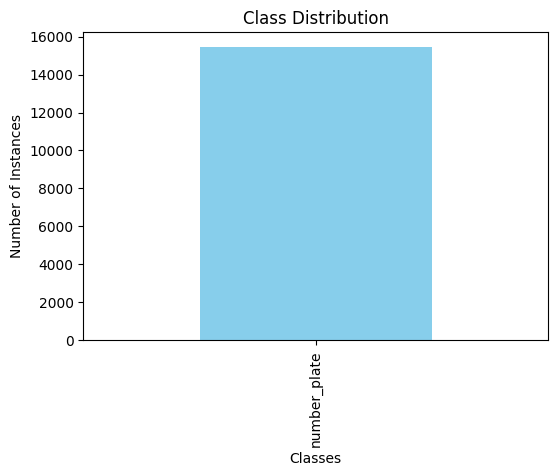



Analyzing class distribution for val set...
Class
number_plate    1913
Name: count, dtype: int64


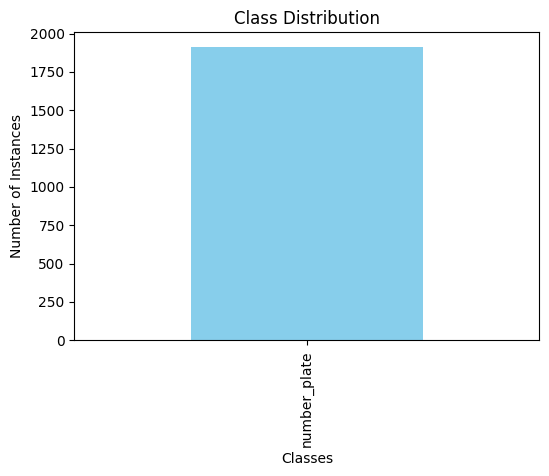



Analyzing class distribution for test set...
Class
number_plate    1952
Name: count, dtype: int64


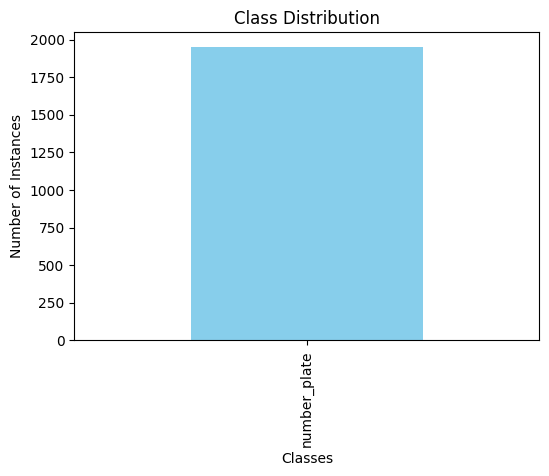

In [4]:
import pandas as pd

def analyze_distribution(images_dir, labels_dir, classes):
    """
    Analyzes the distribution of classes in the dataset.

    Parameters:
    - images_dir (str): Path to the images directory.
    - labels_dir (str): Path to the labels directory.
    - classes (list): List of class names.

    Returns:
    - None
    """
    data = []
    for label_file in os.listdir(labels_dir):
        if not label_file.endswith('.txt'):
            continue
        label_path = os.path.join(labels_dir, label_file)
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                class_id = int(parts[0])
                if class_id < len(classes):
                    class_name = classes[class_id]
                    data.append(class_name)

    if not data:
        print("No data found for class distribution analysis.")
        return

    df = pd.DataFrame(data, columns=['Class'])
    distribution = df['Class'].value_counts()
    print(distribution)

    # Plot distribution
    distribution.plot(kind='bar', figsize=(6,4), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Number of Instances')
    plt.title('Class Distribution')
    plt.show()

# Analyze distribution for each split
for split in ['train', 'val', 'test']:
    print(f"Analyzing class distribution for {split} set...")
    images_dir = os.path.join('yolov9_data', 'images', split)
    labels_dir = os.path.join('yolov9_data', 'labels', split)
    analyze_distribution(images_dir, labels_dir, classes)
    print("\n")

Gathering image size statistics for train set...


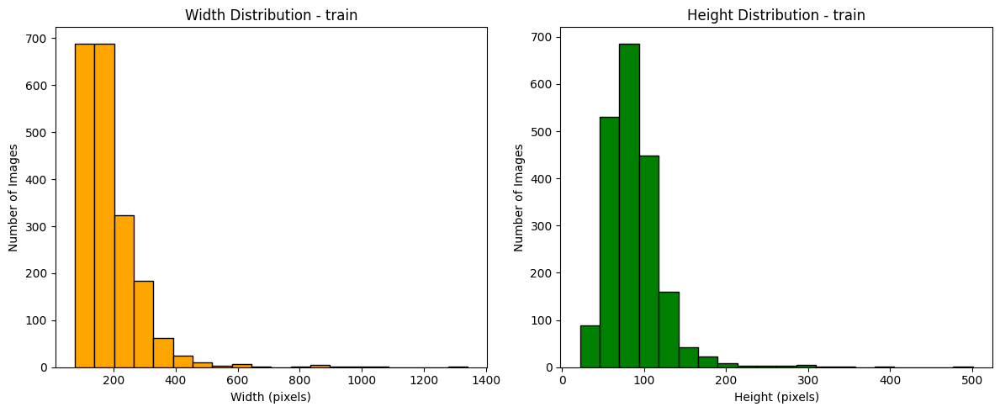



Gathering image size statistics for val set...


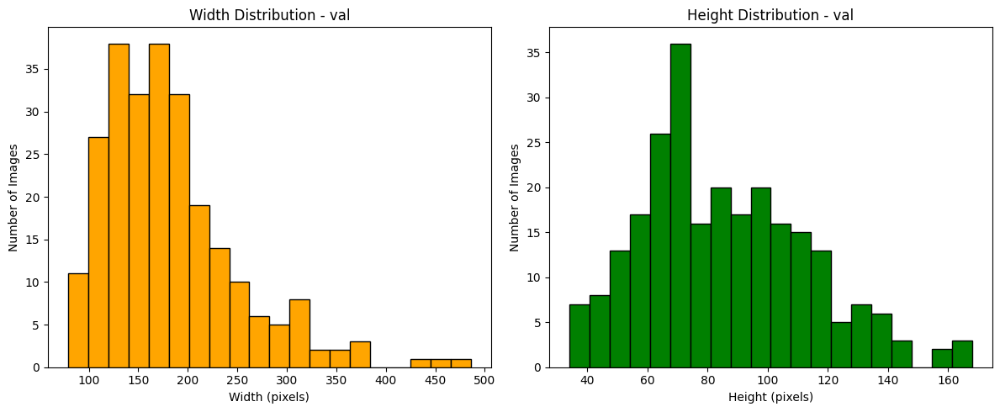



Gathering image size statistics for test set...


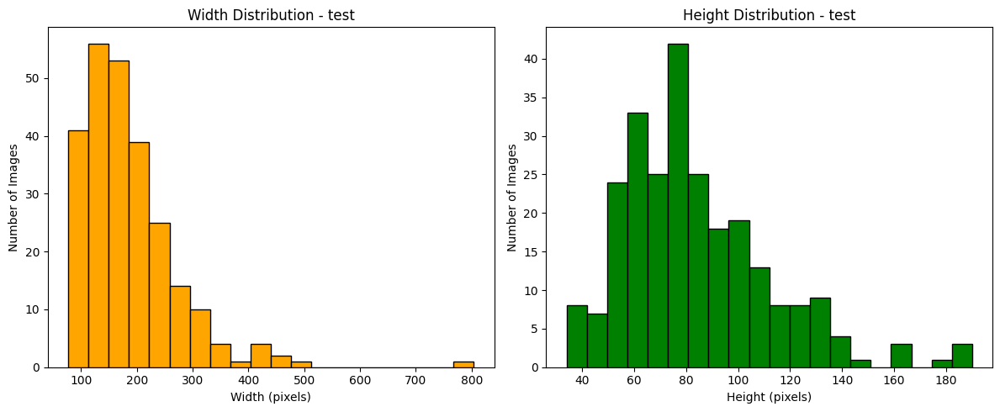

In [5]:
def get_image_sizes(images_dir):
    """
    Retrieves the dimensions of all images in the directory.

    Parameters:
    - images_dir (str): Path to the images directory.

    Returns:
    - list of tuples: Each tuple contains (width, height)
    """
    sizes = []
    for img_file in os.listdir(images_dir):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img_path = os.path.join(images_dir, img_file)
        img = cv2.imread(img_path)
        if img is not None:
            height, width, _ = img.shape
            sizes.append((width, height))
    return sizes

def plot_image_size_distribution(sizes, split):
    widths, heights = zip(*sizes) if sizes else ([], [])
    df = pd.DataFrame({'Width': widths, 'Height': heights})

    plt.figure(figsize=(12, 5))

    # Width Distribution
    plt.subplot(1, 2, 1)
    plt.hist(df['Width'], bins=20, color='orange', edgecolor='black')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Number of Images')
    plt.title(f'Width Distribution - {split}')

    # Height Distribution
    plt.subplot(1, 2, 2)
    plt.hist(df['Height'], bins=20, color='green', edgecolor='black')
    plt.xlabel('Height (pixels)')
    plt.ylabel('Number of Images')
    plt.title(f'Height Distribution - {split}')

    plt.tight_layout()
    plt.show()

# Analyze image sizes for each split
for split in ['train', 'val', 'test']:
    print(f"Gathering image size statistics for {split} set...")
    images_dir = os.path.join('yolov9_data', 'images', split)
    sizes = get_image_sizes(images_dir)
    if sizes:
        plot_image_size_distribution(sizes, split)
    else:
        print(f"No images found in {split} set.")
    print("\n")


In [8]:
data_yaml_content = """
train: yolov9_data/images/train
val: yolov9_data/images/val
test: yolov9_data/images/test
nc: 1
names: ['plate_characters']
"""

with open('data.yaml', 'w') as file:
    file.write(data_yaml_content)

# Display the content to verify
with open('data.yaml', 'r') as file:
    print(file.read())


train: yolov9_data/images/train
val: yolov9_data/images/val
test: yolov9_data/images/test 
nc: 1
names: ['plate_characters']



In [9]:
from ultralytics import YOLO

# Initialize the YOLOv9 model
model = YOLO('yolov9s.yaml')

# Start training
results = model.train(
    data='/content/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    name='number_plate_detection',
    cache=True
)

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.yaml, data=/content/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=True, device=None, workers=8, project=None, name=number_plate_detection3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

100%|██████████| 755k/755k [00:00<00:00, 23.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     31104  ultralytics.nn.modules.block.ELAN1           [64, 64, 64, 32]              
  3                  -1  1     73984  ultralytics.nn.modules.block.AConv           [64, 128]                     
  4                  -1  1    258432  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 128, 128, 64, 3]        
  5                  -1  1    221568  ultralytics.nn.modules.block.AConv           [128, 192]                    
  6                  -1  1    579648  ultralytics.nn.modules.block.RepNCSPELAN4    [192, 192, 192, 96, 3]        
  7                  -1  1    442880  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 98.1MB/s]


AMP: checks passed ✅


train: Scanning /content/yolov9_data/labels/train... 2002 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2002/2002 [00:01<00:00, 1845.54it/s]


train: New cache created: /content/yolov9_data/labels/train.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (1.2GB RAM): 100%|██████████| 2002/2002 [00:02<00:00, 738.39it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolov9_data/labels/val... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 979.20it/s] 

val: New cache created: /content/yolov9_data/labels/val.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 250/250 [00:00<00:00, 339.70it/s]


Plotting labels to runs/detect/number_plate_detection3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 227 weight(decay=0.0), 234 weight(decay=0.0005), 233 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/number_plate_detection3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       5.4G      2.999      2.584      3.326         46        640: 100%|██████████| 126/126 [01:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250       1913      0.539      0.384      0.439      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.36G      1.567      1.075      1.761         34        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]

                   all        250       1913      0.908      0.844      0.927      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.34G      1.386     0.8624      1.563         59        640: 100%|██████████| 126/126 [00:56<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.44it/s]

                   all        250       1913      0.913      0.881      0.947      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.34G      1.276     0.7605      1.471         51        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.45it/s]

                   all        250       1913      0.923      0.894      0.962      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.35G      1.187     0.6835      1.405         17        640: 100%|██████████| 126/126 [00:55<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]

                   all        250       1913      0.949      0.923      0.971        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.31G      1.152     0.6534      1.373         24        640: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.42it/s]

                   all        250       1913      0.933      0.932      0.972      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.36G      1.084     0.6034      1.325         47        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        250       1913      0.938      0.928      0.975       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.31G      1.039     0.5792      1.299         23        640: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.48it/s]

                   all        250       1913      0.954      0.931      0.979      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.36G      1.024      0.566      1.284         42        640: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]

                   all        250       1913      0.963      0.919      0.977       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.32G     0.9951     0.5431      1.258         35        640: 100%|██████████| 126/126 [00:55<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]

                   all        250       1913      0.948      0.947      0.978      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.35G     0.9918     0.5357      1.253         45        640: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]

                   all        250       1913      0.958      0.944      0.982      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.32G     0.9424     0.5064      1.216         52        640: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.47it/s]

                   all        250       1913       0.94      0.945      0.982      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.36G     0.9187     0.4968      1.205         24        640: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]

                   all        250       1913      0.954      0.958      0.985       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.32G     0.9035     0.4857      1.195         20        640: 100%|██████████| 126/126 [00:56<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]

                   all        250       1913      0.956      0.951      0.985       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.35G     0.8784     0.4745      1.178         28        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]

                   all        250       1913       0.95      0.955      0.984      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.33G     0.8533     0.4573      1.161         41        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]

                   all        250       1913      0.955      0.971      0.986      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.36G     0.8408     0.4503      1.151         34        640: 100%|██████████| 126/126 [00:54<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]

                   all        250       1913      0.949      0.955      0.983      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.32G      0.812     0.4319      1.132         27        640: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.36it/s]

                   all        250       1913      0.968      0.963      0.989      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.34G     0.8102     0.4228      1.126         61        640: 100%|██████████| 126/126 [00:56<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]

                   all        250       1913      0.973      0.954      0.985      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.33G     0.7619     0.4092      1.101         30        640: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.46it/s]

                   all        250       1913      0.966      0.961       0.99      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.36G     0.7606     0.4069      1.094         49        640: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]

                   all        250       1913      0.978      0.962       0.99       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.32G     0.7472     0.3981      1.092         45        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        250       1913      0.976      0.962       0.99      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.33G     0.7334      0.391      1.085         23        640: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]

                   all        250       1913      0.965      0.965      0.985      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.34G       0.71     0.3828      1.069         42        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]

                   all        250       1913      0.972      0.968       0.99       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.34G     0.6999     0.3739       1.06         30        640: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]

                   all        250       1913      0.977      0.948      0.984      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.33G     0.6862     0.3687      1.055         59        640: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.47it/s]

                   all        250       1913      0.968      0.966      0.988      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.35G     0.6714     0.3634      1.045         30        640: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]

                   all        250       1913       0.98      0.964       0.99       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.32G     0.6527     0.3527      1.034         55        640: 100%|██████████| 126/126 [00:57<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]

                   all        250       1913      0.984       0.96      0.992      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.34G     0.6458     0.3466      1.026         42        640: 100%|██████████| 126/126 [00:53<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.03it/s]

                   all        250       1913      0.983      0.964       0.99      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.32G      0.638     0.3431      1.022         55        640: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]

                   all        250       1913      0.981      0.975      0.991      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.35G     0.6204     0.3401      1.018         21        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.20it/s]

                   all        250       1913      0.979      0.977      0.992      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.32G     0.6136     0.3348      1.008         29        640: 100%|██████████| 126/126 [00:57<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]

                   all        250       1913      0.981      0.973      0.992      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.36G     0.6103     0.3321      1.008         61        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]

                   all        250       1913      0.979      0.973      0.991      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.35G       0.59      0.326     0.9982         42        640: 100%|██████████| 126/126 [00:53<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]

                   all        250       1913      0.979      0.968      0.991      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.34G     0.5774     0.3172     0.9881         16        640: 100%|██████████| 126/126 [00:56<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.24it/s]

                   all        250       1913       0.98      0.968       0.99       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.33G     0.5605     0.3097      0.982         23        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]

                   all        250       1913      0.984      0.969      0.992      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.36G     0.5595     0.3078     0.9814         44        640: 100%|██████████| 126/126 [00:59<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]

                   all        250       1913      0.981      0.979      0.992      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.32G      0.537     0.2979     0.9706         35        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        250       1913      0.981      0.968      0.992      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.34G     0.5411     0.3014     0.9742         25        640: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]

                   all        250       1913      0.984      0.972      0.993       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.31G     0.5265     0.2958     0.9663         33        640: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.18it/s]

                   all        250       1913      0.985      0.969      0.992      0.831


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.36G     0.7056     0.3356      1.079         19        640: 100%|██████████| 126/126 [00:55<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.37it/s]

                   all        250       1913       0.98      0.971       0.99       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.32G      0.685     0.3185      1.058         18        640: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]

                   all        250       1913       0.98      0.972      0.991       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.36G     0.6627     0.3031      1.048         14        640: 100%|██████████| 126/126 [00:54<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.36it/s]

                   all        250       1913      0.987      0.971      0.992      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.31G     0.6536     0.2992      1.038         15        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]

                   all        250       1913      0.991      0.977      0.994      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.36G     0.6432     0.2886      1.032         13        640: 100%|██████████| 126/126 [00:54<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]

                   all        250       1913      0.991      0.977      0.994      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.34G     0.6327     0.2834      1.025         14        640: 100%|██████████| 126/126 [00:55<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]

                   all        250       1913      0.989      0.978      0.994      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.37G      0.624     0.2795      1.021         15        640: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.44it/s]

                   all        250       1913      0.991      0.978      0.994      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      5.32G     0.6184     0.2737      1.016         14        640: 100%|██████████| 126/126 [00:54<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        250       1913       0.99      0.978      0.994      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      5.36G     0.6154     0.2705      1.013         19        640: 100%|██████████| 126/126 [00:54<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]

                   all        250       1913      0.992      0.979      0.994      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.31G     0.6056     0.2657      1.011         14        640: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]

                   all        250       1913      0.993      0.978      0.994      0.859



50 epochs completed in 0.827 hours.
Optimizer stripped from runs/detect/number_plate_detection3/weights/last.pt, 13.3MB
Optimizer stripped from runs/detect/number_plate_detection3/weights/best.pt, 13.3MB

Validating runs/detect/number_plate_detection3/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9s summary (fused): 504 layers, 6,194,035 parameters, 0 gradients, 22.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.64it/s]


                   all        250       1913      0.993      0.978      0.994      0.859
Speed: 0.2ms preprocess, 3.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/number_plate_detection3


Model type: <class 'ultralytics.models.yolo.model.YOLO'>

image 1/1 /content/cropped_plate_2024-03-08_180_4_0.jpg: 384x640 8 plate_characterss, 19.9ms
Speed: 1.6ms preprocess, 19.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results type: <class 'list'>
Number of results: 1


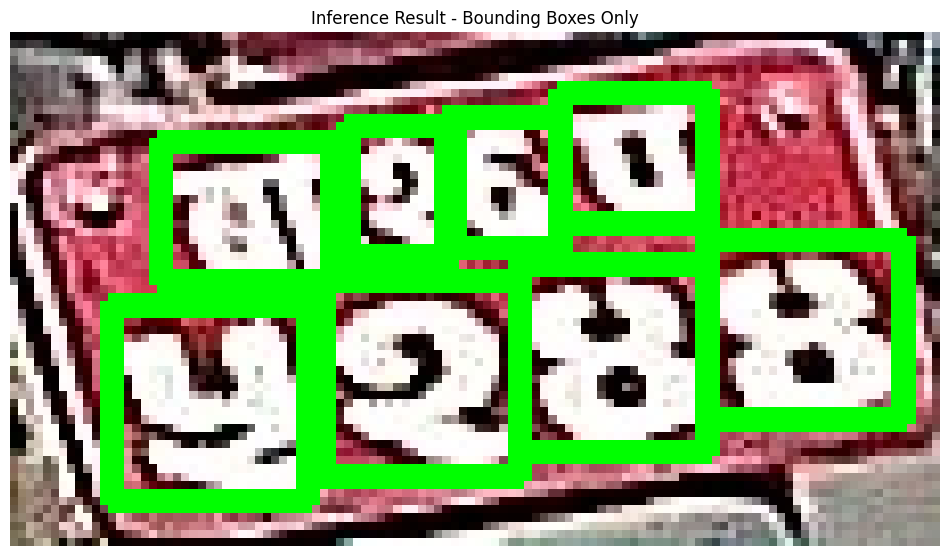

Annotated image saved at /content/inference_result_annotated.jpg


In [13]:
trained_model_path = '/content/runs/detect/number_plate_detection3/weights/best.pt'  # Replace with your actual path

# Check if the model file exists
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at {trained_model_path}")

# Load the trained YOLOv9 model
model = YOLO(trained_model_path)

# Verify the model type
print(f"Model type: {type(model)}")
# ============================================

# Path to the image to perform inference on
image_path = '/content/cropped_plate_2024-03-08_180_4_0.jpg'

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image not found at {image_path}")

# Perform inference
results = model(image_path)

# Check the type and length of results
print(f"Results type: {type(results)}")
print(f"Number of results: {len(results)}")
result = results[0]

# Get the detected bounding boxes
boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding boxes in [x1, y1, x2, y2] format

# Load the original image
original_img = cv2.imread(image_path)

# Draw only the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = map(int, box[:4])  # Convert coordinates to integers
    cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding boxes

# Convert BGR image to RGB for Matplotlib
annotated_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Display the annotated image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(annotated_img_rgb)
plt.axis('off')
plt.title("Inference Result - Bounding Boxes Only")
plt.show()

# Save the annotated image
save_path = '/content/inference_result_annotated.jpg'
cv2.imwrite(save_path, original_img)

print(f"Annotated image saved at {save_path}")

Model type: <class 'ultralytics.models.yolo.model.YOLO'>

image 1/1 /content/cropped_plate_2024-03-08_2273_1_0.jpg: 256x640 12 plate_characterss, 56.6ms
Speed: 1.6ms preprocess, 56.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 640)
Results type: <class 'list'>
Number of results: 1


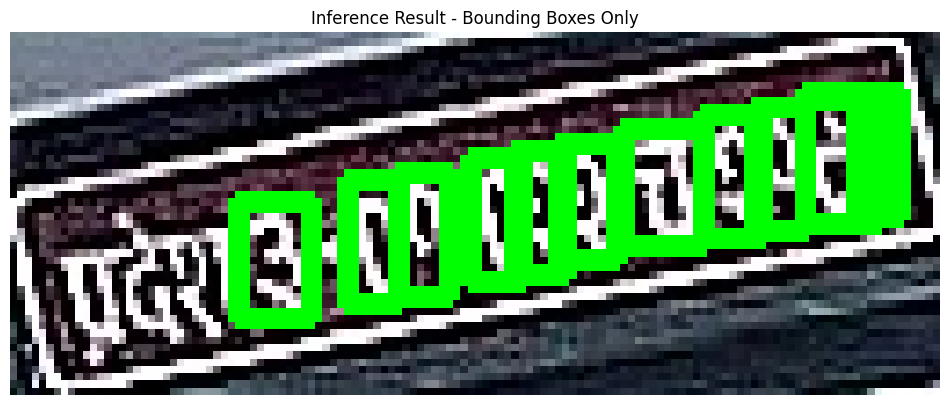

Annotated image saved at /content/inference_result_annotated.jpg


In [14]:
trained_model_path = '/content/runs/detect/number_plate_detection3/weights/best.pt'  # Replace with your actual path

# Check if the model file exists
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at {trained_model_path}")

# Load the trained YOLOv9 model
model = YOLO(trained_model_path)

# Verify the model type
print(f"Model type: {type(model)}")
# ============================================

# Path to the image to perform inference on
image_path = '/content/cropped_plate_2024-03-08_2273_1_0.jpg'

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image not found at {image_path}")

# Perform inference
results = model(image_path)

# Check the type and length of results
print(f"Results type: {type(results)}")
print(f"Number of results: {len(results)}")
result = results[0]

# Get the detected bounding boxes
boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding boxes in [x1, y1, x2, y2] format

# Load the original image
original_img = cv2.imread(image_path)

# Draw only the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = map(int, box[:4])  # Convert coordinates to integers
    cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding boxes

# Convert BGR image to RGB for Matplotlib
annotated_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Display the annotated image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(annotated_img_rgb)
plt.axis('off')
plt.title("Inference Result - Bounding Boxes Only")
plt.show()

# Save the annotated image
save_path = '/content/inference_result_annotated.jpg'
cv2.imwrite(save_path, original_img)

print(f"Annotated image saved at {save_path}")

Model type: <class 'ultralytics.models.yolo.model.YOLO'>

image 1/1 /content/cropped_plate_2024-03-08_373_0_0.jpg: 160x640 7 plate_characterss, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 1.4ms postprocess per image at shape (1, 3, 160, 640)
Results type: <class 'list'>
Number of results: 1


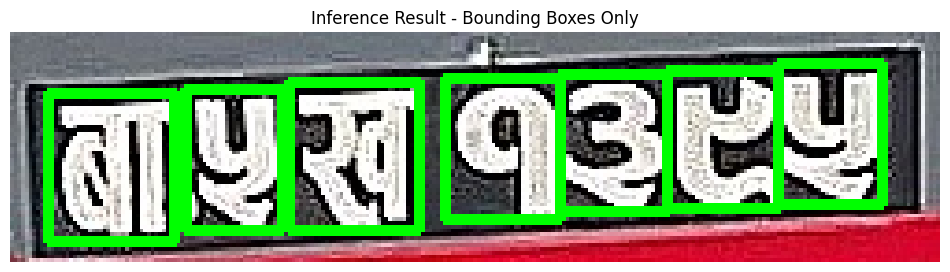

Annotated image saved at /content/inference_result_annotated.jpg


In [15]:
trained_model_path = '/content/runs/detect/number_plate_detection3/weights/best.pt'  # Replace with your actual path

# Check if the model file exists
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at {trained_model_path}")

# Load the trained YOLOv9 model
model = YOLO(trained_model_path)

# Verify the model type
print(f"Model type: {type(model)}")
# ============================================

# Path to the image to perform inference on
image_path = '/content/cropped_plate_2024-03-08_373_0_0.jpg'

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image not found at {image_path}")

# Perform inference
results = model(image_path)

# Check the type and length of results
print(f"Results type: {type(results)}")
print(f"Number of results: {len(results)}")
result = results[0]

# Get the detected bounding boxes
boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding boxes in [x1, y1, x2, y2] format

# Load the original image
original_img = cv2.imread(image_path)

# Draw only the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = map(int, box[:4])  # Convert coordinates to integers
    cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding boxes

# Convert BGR image to RGB for Matplotlib
annotated_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Display the annotated image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(annotated_img_rgb)
plt.axis('off')
plt.title("Inference Result - Bounding Boxes Only")
plt.show()

# Save the annotated image
save_path = '/content/inference_result_annotated.jpg'
cv2.imwrite(save_path, original_img)

print(f"Annotated image saved at {save_path}")

Model type: <class 'ultralytics.models.yolo.model.YOLO'>

image 1/1 /content/cropped_plate_2024-03-08_415_2_0.jpg: 384x640 7 plate_characterss, 22.1ms
Speed: 1.7ms preprocess, 22.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results type: <class 'list'>
Number of results: 1


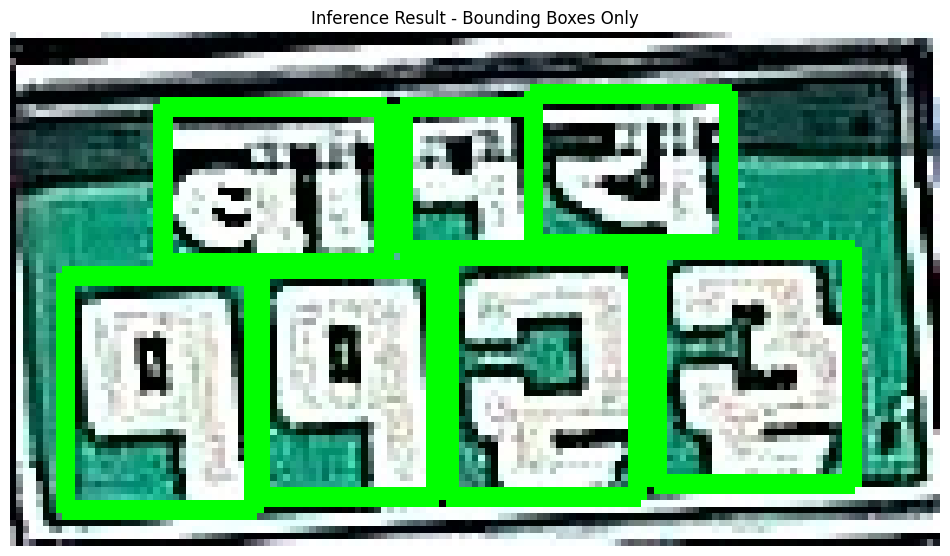

Annotated image saved at /content/inference_result_annotated.jpg


In [16]:
trained_model_path = '/content/runs/detect/number_plate_detection3/weights/best.pt'  # Replace with your actual path

# Check if the model file exists
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at {trained_model_path}")

# Load the trained YOLOv9 model
model = YOLO(trained_model_path)

# Verify the model type
print(f"Model type: {type(model)}")
# ============================================

# Path to the image to perform inference on
image_path = '/content/cropped_plate_2024-03-08_415_2_0.jpg'

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image not found at {image_path}")

# Perform inference
results = model(image_path)

# Check the type and length of results
print(f"Results type: {type(results)}")
print(f"Number of results: {len(results)}")
result = results[0]

# Get the detected bounding boxes
boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding boxes in [x1, y1, x2, y2] format

# Load the original image
original_img = cv2.imread(image_path)

# Draw only the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = map(int, box[:4])  # Convert coordinates to integers
    cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding boxes

# Convert BGR image to RGB for Matplotlib
annotated_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Display the annotated image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(annotated_img_rgb)
plt.axis('off')
plt.title("Inference Result - Bounding Boxes Only")
plt.show()

# Save the annotated image
save_path = '/content/inference_result_annotated.jpg'
cv2.imwrite(save_path, original_img)

print(f"Annotated image saved at {save_path}")

Model type: <class 'ultralytics.models.yolo.model.YOLO'>

image 1/1 /content/Capture.PNG: 416x640 8 plate_characterss, 111.7ms
Speed: 2.6ms preprocess, 111.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
Results type: <class 'list'>
Number of results: 1


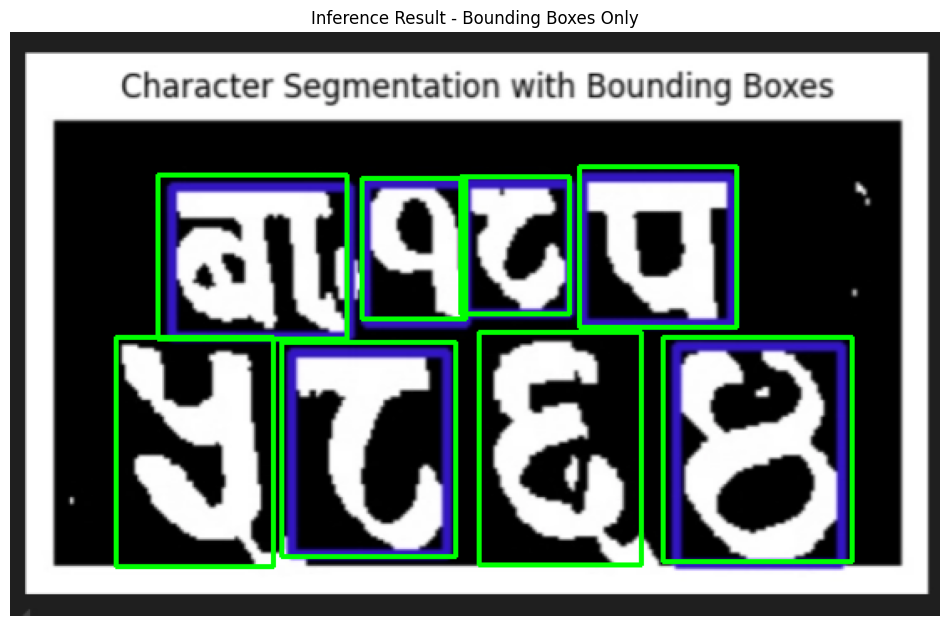

Annotated image saved at /content/inference_result_annotated.jpg


In [17]:
trained_model_path = '/content/runs/detect/number_plate_detection3/weights/best.pt'  # Replace with your actual path

# Check if the model file exists
if not os.path.exists(trained_model_path):
    raise FileNotFoundError(f"Trained model not found at {trained_model_path}")

# Load the trained YOLOv9 model
model = YOLO(trained_model_path)

# Verify the model type
print(f"Model type: {type(model)}")
# ============================================

# Path to the image to perform inference on
image_path = '/content/Capture.PNG'

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image not found at {image_path}")

# Perform inference
results = model(image_path)

# Check the type and length of results
print(f"Results type: {type(results)}")
print(f"Number of results: {len(results)}")
result = results[0]

# Get the detected bounding boxes
boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding boxes in [x1, y1, x2, y2] format

# Load the original image
original_img = cv2.imread(image_path)

# Draw only the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = map(int, box[:4])  # Convert coordinates to integers
    cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding boxes

# Convert BGR image to RGB for Matplotlib
annotated_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Display the annotated image using Matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(annotated_img_rgb)
plt.axis('off')
plt.title("Inference Result - Bounding Boxes Only")
plt.show()

# Save the annotated image
save_path = '/content/inference_result_annotated.jpg'
cv2.imwrite(save_path, original_img)

print(f"Annotated image saved at {save_path}")

In [18]:
import shutil
from google.colab import files

# Zip the folder
shutil.make_archive('/content/number_plate_detection3', 'zip', '/content/runs/detect/number_plate_detection3')

# Download the zipped folder
files.download('/content/number_plate_detection3.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>